In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 2.4 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
import os
from PIL import Image
from IPython.display import display
import glob

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
model = YOLO("yolov8n.pt")

In [4]:
import glob
import os

image_folder = "/kaggle/input/notebooks/stpeteishii/coco128-data-for-yolov8/datasets/test"

image_paths = (
    glob.glob(os.path.join(image_folder, "*.jpg")) +
    glob.glob(os.path.join(image_folder, "*.jpeg")) +
    glob.glob(os.path.join(image_folder, "*.png"))
)

print("Total Images:", len(image_paths))
print(image_paths[:5])

Total Images: 28
['/kaggle/input/notebooks/stpeteishii/coco128-data-for-yolov8/datasets/test/000000000486.jpg', '/kaggle/input/notebooks/stpeteishii/coco128-data-for-yolov8/datasets/test/000000000443.jpg', '/kaggle/input/notebooks/stpeteishii/coco128-data-for-yolov8/datasets/test/000000000389.jpg', '/kaggle/input/notebooks/stpeteishii/coco128-data-for-yolov8/datasets/test/000000000589.jpg', '/kaggle/input/notebooks/stpeteishii/coco128-data-for-yolov8/datasets/test/000000000510.jpg']


In [5]:
results = model.predict(
    source=image_paths,
    conf=0.25,
    save=True
)


0: 640x640 1 bowl, 1 dining table, 2 tvs, 2 microwaves, 211.4ms
1: 640x640 1 person, 1 cat, 1 dog, 1 remote, 211.4ms
2: 640x640 9 persons, 1 tie, 211.4ms
3: 640x640 1 person, 211.4ms
4: 640x640 1 person, 2 benchs, 211.4ms
5: 640x640 1 sink, 211.4ms
6: 640x640 1 person, 1 wine glass, 1 knife, 2 microwaves, 211.4ms
7: 640x640 1 potted plant, 1 sink, 211.4ms
8: 640x640 1 person, 1 bottle, 1 donut, 211.4ms
9: 640x640 2 persons, 5 kites, 211.4ms
10: 640x640 7 birds, 211.4ms
11: 640x640 (no detections), 211.4ms
12: 640x640 1 fork, 1 cake, 1 dining table, 211.4ms
13: 640x640 1 bottle, 1 bowl, 2 potted plants, 1 oven, 1 refrigerator, 2 clocks, 2 vases, 211.4ms
14: 640x640 1 person, 1 cow, 211.4ms
15: 640x640 4 persons, 9 umbrellas, 211.4ms
16: 640x640 2 persons, 211.4ms
17: 640x640 1 spoon, 10 bowls, 1 broccoli, 9 carrots, 1 dining table, 211.4ms
18: 640x640 3 giraffes, 211.4ms
19: 640x640 1 bottle, 1 bowl, 1 tv, 211.4ms
20: 640x640 (no detections), 211.4ms
21: 640x640 5 persons, 1 bicycle, 1

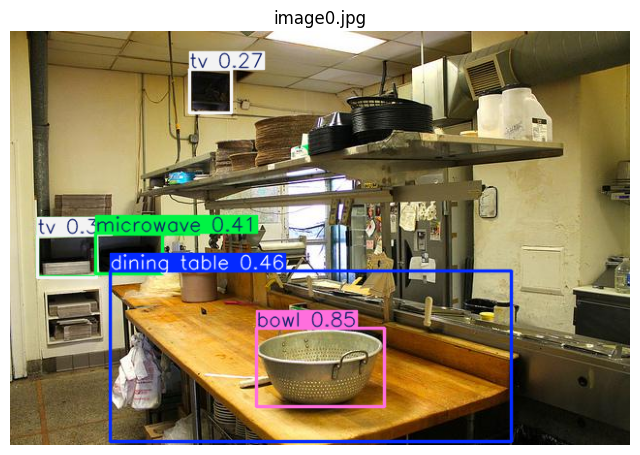

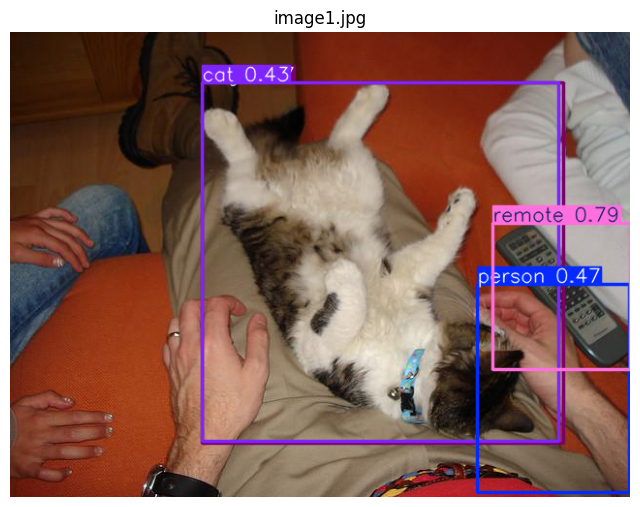

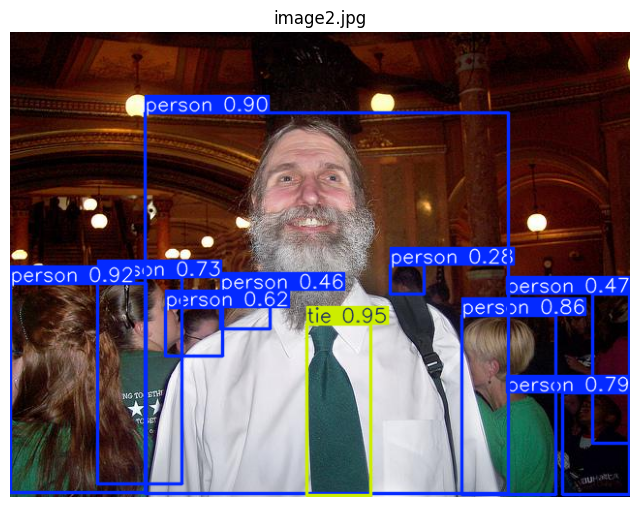

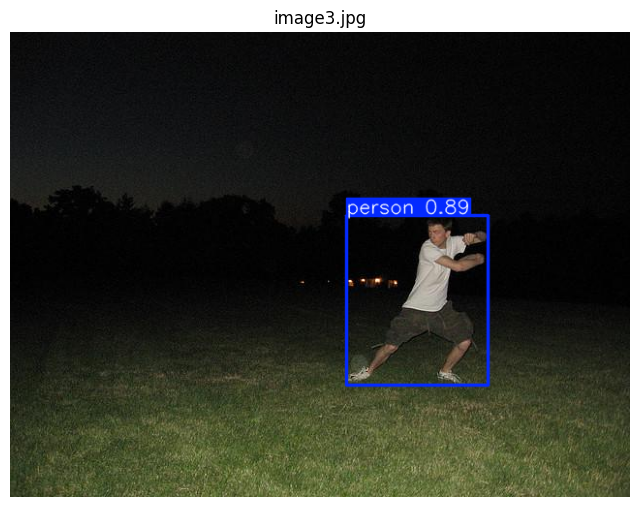

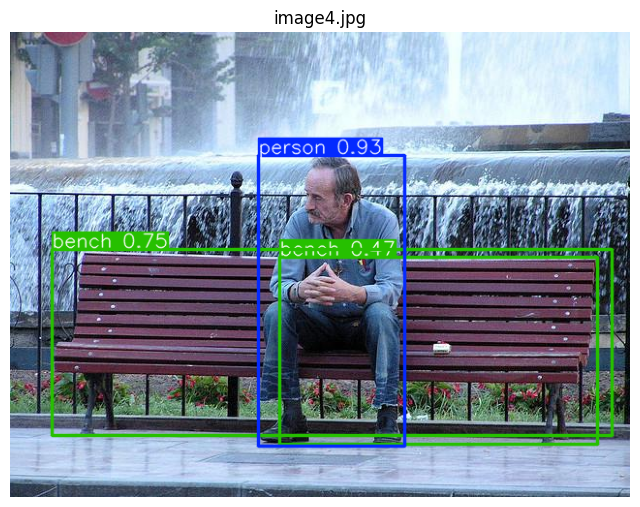

...

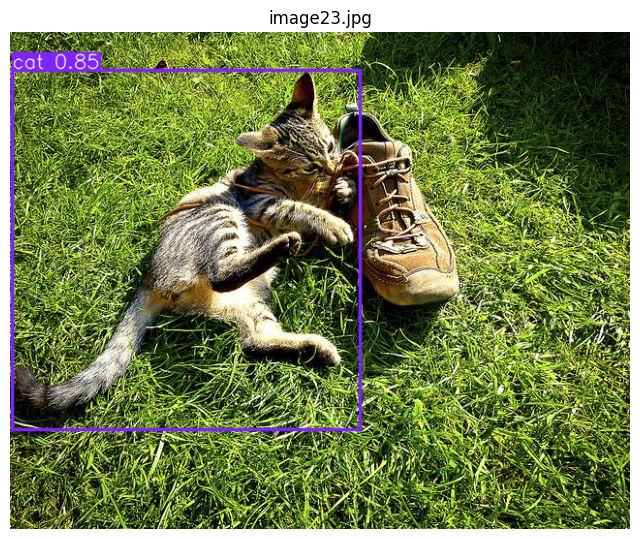

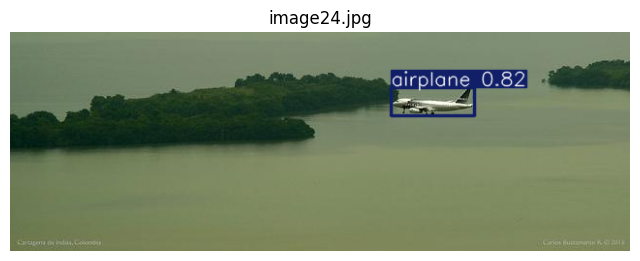

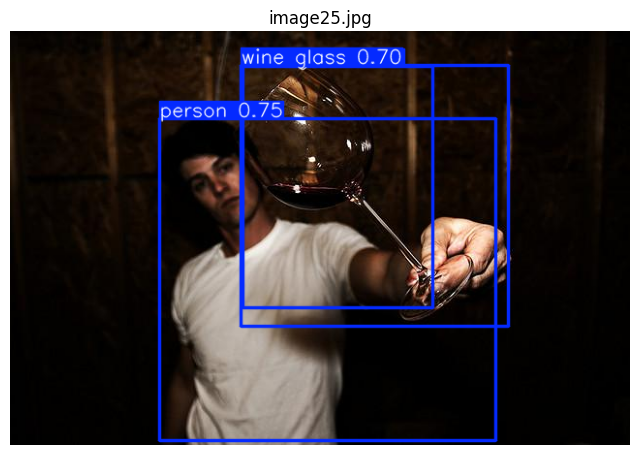

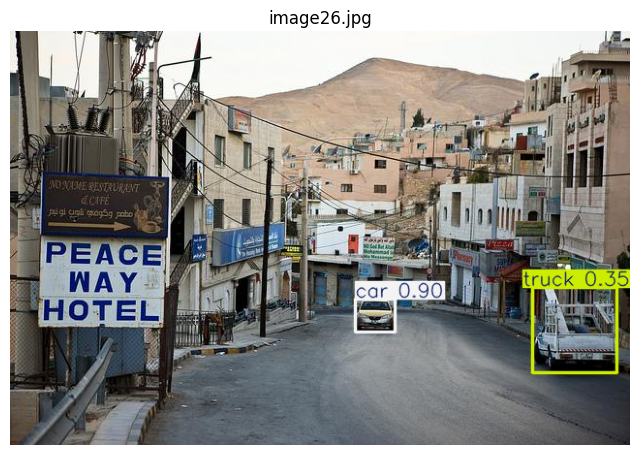

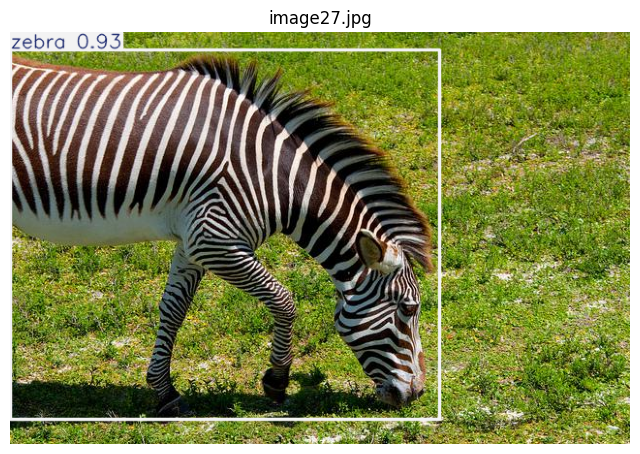

In [9]:
import matplotlib.pyplot as plt
import cv2

# First 10 and last 10 results
selected_results = results[:10] + results[-10:]

for result in selected_results:
    img = result.plot()

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(result.path.split("/")[-1])
    plt.axis("off")
    plt.show()

In [7]:
for result in results:
    print(f"\nImage: {result.path}")

    for box in result.boxes:
        cls = int(box.cls[0])
        conf = float(box.conf[0])

        print(f"Object: {model.names[cls]} | Confidence: {conf:.2f}")


Image: image0.jpg
Object: bowl | Confidence: 0.85
Object: dining table | Confidence: 0.46
Object: microwave | Confidence: 0.41
Object: tv | Confidence: 0.31
Object: tv | Confidence: 0.27
Object: microwave | Confidence: 0.26

Image: image1.jpg
Object: remote | Confidence: 0.79
Object: person | Confidence: 0.47
Object: cat | Confidence: 0.43
Object: dog | Confidence: 0.37

Image: image2.jpg
Object: tie | Confidence: 0.95
Object: person | Confidence: 0.92
Object: person | Confidence: 0.90
Object: person | Confidence: 0.86
Object: person | Confidence: 0.79
Object: person | Confidence: 0.73
Object: person | Confidence: 0.62
Object: person | Confidence: 0.47
Object: person | Confidence: 0.46
Object: person | Confidence: 0.28

Image: image3.jpg
Object: person | Confidence: 0.89

Image: image4.jpg
Object: person | Confidence: 0.93
Object: bench | Confidence: 0.75
Object: bench | Confidence: 0.47

Image: image5.jpg
Object: sink | Confidence: 0.72

Image: image6.jpg
Object: person | Confidence:

In [11]:
import os

os.makedirs("sample_results/input_images", exist_ok=True)
os.makedirs("sample_results/output_images", exist_ok=True)

In [12]:
import shutil

selected_images = image_paths[:5]

for img in selected_images:
    shutil.copy(img, "sample_results/input_images")

print("Input images saved!")

Input images saved!


In [13]:
import glob
import shutil
import os

predicted_images = sorted(glob.glob("runs/detect/predict/*.jpg"))[:5]

for img in predicted_images:
    shutil.copy(img, "sample_results/output_images")

print("Predicted images saved!")

Predicted images saved!


In [14]:
print("Input Images:")
print(os.listdir("sample_results/input_images"))

print("\nOutput Images:")
print(os.listdir("sample_results/output_images"))

Input Images:
['000000000510.jpg', '000000000486.jpg', '000000000443.jpg', '000000000389.jpg', '000000000589.jpg']

Output Images:
['image0.jpg', 'image1.jpg', 'image12.jpg', 'image11.jpg', 'image10.jpg']
